In [1]:
#This notebook is a template for designing a visualization that shows the exclusivity and word usage between
#different classes. I am using a labeled data set of fake and real news. The chart displays the log scale of 
#each classes' TFIDF matrix plotted against each other. Further description after the chart renders

#if this is your first time install requirements.txt and uncomment the NLTK and spacy download commands in 
#the first cell

#Inspiration from Dataclysm by Christian Rudder

#Author: Yoni Levine yoni.levine@aol.com

In [4]:
#standard imports
import pandas as pd 
import numpy as np 
from tqdm.notebook import tqdm
tqdm.pandas(desc='progress-bar')
import matplotlib.pyplot as plt 
import math

#text processing
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
import nltk
# nltk.download('punkt') #first time downloads
# nltk.download('stopwords') #first time downloads
from nltk.corpus import stopwords
from nltk import word_tokenize
from nltk.stem import WordNetLemmatizer
stopwords = set(stopwords.words('english'))
wordnet_lemmatizer = WordNetLemmatizer()
import re
import string

#bokeh imports
import bokeh
from bokeh.plotting import figure, show, output_file
from bokeh.models import HoverTool, ColumnDataSource, Slope, Label
from bokeh.io import output_notebook

# !python -m spacy download en #first time downloads
import spacy
nlp = spacy.load('en_core_web_sm',disable=['parser', 'ner'])

#settings
pd.set_option('display.max_columns',None)
pd.set_option('display.float_format', lambda x: '%.3f' %x)
import multiprocessing
cores = multiprocessing.cpu_count()
output_notebook()

Loading BokehJS ...

In [5]:
# Add or remove stopwords 
remove_sw = []
custom_stopwords = stopwords - set(remove_sw)

add_sw = []
for word in add_sw:
    custom_stopwords.add(word)

In [6]:
def removeNonEnglishChars(text):
    encoded_string = text.encode("ascii", "ignore")
    decode_string = encoded_string.decode()
    return decode_string

In [7]:
def split(text):
    for word in text:
        text = text.split()
        return text

In [8]:
def lowerCase(text):
    text = text.lower()
    return text

In [9]:
def removePunctuation(text):
    text  = ''.join([char for char in text if char not in string.punctuation])
    return text

In [10]:
def removeNumbers(text):
    text = ''.join([i for i in text if not i.isdigit()])         
    return text

In [11]:
def removeStopwords(text,stopwords):
    res = []
    for word in text.split():
        if word not in stopwords:
            res.append(word)
    return ' '.join(res)

In [12]:
def lemmatizerPipe(texts):
    lemmatized = []
    for doc in tqdm(nlp.pipe(texts, disable=["ner", "parser"],n_process=cores-1),total=len(texts)):
        lemmatized.append(" ".join([token.lemma_ for token in doc]))
    return lemmatized

In [13]:
#Lemmatizing sets word to the root form, for e.g. running, runs, ran all equal run.
#example usage
lemmatizerPipe(["The striped bats are hanging on their feet for best","The quick brown fox jumped over the lazy dog"])

['the stripe bat be hang on -PRON- foot for good',
 'the quick brown fox jump over the lazy dog']

In [16]:
def cleanText(text):
    text = lowerCase(text)
    text = removePunctuation(text)
    text = removeNumbers(text)
    text = removeStopwords(text,custom_stopwords)
    return text

In [17]:
def lemmatizer(text):
    doc = nlp(text)
    return " ".join([token.lemma_ for token in doc])

In [18]:
url = 'https://drive.google.com/file/d/1dAI7B-ZNK3M4VDxjFeI2DOBUF8yejQde/view?usp=sharing'
path = 'https://drive.google.com/uc?export=download&id='+url.split('/')[-2]
df_fake = pd.read_csv(path)

url = 'https://drive.google.com/file/d/13En-O1E4MD9FNKMfnl1uC39I5FYaFIsN/view?usp=sharing'
path = 'https://drive.google.com/uc?export=download&id='+url.split('/')[-2]
df_true = pd.read_csv(path)

In [19]:
df_fake.head()

,title,text,subject,date
0,Donald Trump Sends Out Embarrassing New Year’...,Donald Trump just couldn t wish all Americans ...,News,"December 31, 2017"
1,Drunk Bragging Trump Staffer Started Russian ...,House Intelligence Committee Chairman Devin Nu...,News,"December 31, 2017"
2,Sheriff David Clarke Becomes An Internet Joke...,"On Friday, it was revealed that former Milwauk...",News,"December 30, 2017"
3,Trump Is So Obsessed He Even Has Obama’s Name...,"On Christmas day, Donald Trump announced that ...",News,"December 29, 2017"
4,Pope Francis Just Called Out Donald Trump Dur...,Pope Francis used his annual Christmas Day mes...,News,"December 25, 2017"


In [20]:
df_true.head()

,title,text,subject,date
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,politicsNews,"December 31, 2017"
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,politicsNews,"December 29, 2017"
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,politicsNews,"December 31, 2017"
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,politicsNews,"December 30, 2017"
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,politicsNews,"December 29, 2017"


In [21]:
#labeling and merging data
df_true['fake'] = [0 for text in df_true['text']]
df_fake['fake'] = [1 for text in df_fake['text']]
df = pd.concat([df_true,df_fake])

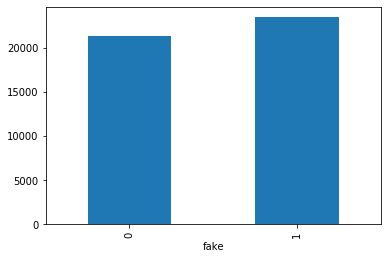

In [22]:
df.groupby(['fake']).fake.count().plot(kind='bar')

In [23]:
df['cleantext'] = df['text'].progress_map(cleanText)

In [24]:
df['cleantext'] = lemmatizerPipe(df['cleantext'])

In [25]:
df_text = df[['cleantext','fake']]

In [26]:
#seperating data into different classes 
df_true = df_text[df_text.fake==0]
df_fake = df_text[df_text.fake==1]

In [27]:
# using min_df = 10 to ignore terms that occur in less than 10 documents for memory reasons
# you can also set a max df as a float, e.g .5 will exclude terms taht occur in > 50% of documents

#true tfidf vectorizing
cvt = TfidfVectorizer(ngram_range=(1,2),min_df=10)

X_all = cvt.fit_transform(df_true['cleantext'].apply(lambda x: np.str_(x)))

X = pd.DataFrame(cvt.transform(df_true['cleantext'].values.astype('U')).todense(),columns = cvt.get_feature_names())

true_tfidf_ngram = X.sum(axis=0)

# fake tfidf vectorizing
cvt = TfidfVectorizer(ngram_range=(1,2),min_df=10)
X_all = cvt.fit_transform(df_fake['cleantext'].apply(lambda x: np.str_(x)))

X = pd.DataFrame(cvt.transform(df_fake['cleantext'].values.astype('U')).todense(),columns = cvt.get_feature_names())

fake_tfidf_ngram = X.sum(axis=0)

# true count vectorizing
cvt = CountVectorizer(ngram_range=(1,2),min_df=10)

X_all = cvt.fit_transform(df_true['cleantext'].apply(lambda x: np.str_(x)))

X = pd.DataFrame(cvt.transform(df_true['cleantext'].values.astype('U')).todense(),columns = cvt.get_feature_names())

true_count_ngram = X.sum(axis=0)

# fake count vectorizing
cvt = CountVectorizer(ngram_range=(1,2),min_df=10)
X_all = cvt.fit_transform(df_fake['cleantext'].apply(lambda x: np.str_(x)))

X = pd.DataFrame(cvt.transform(df_fake['cleantext'].values.astype('U')).todense(),columns = cvt.get_feature_names())

fake_count_ngram = X.sum(axis=0)

In [28]:
#creating data frame with tfidf values
true = pd.DataFrame(true_tfidf_ngram,columns=['true_tfidf'])
fake = pd.DataFrame(fake_tfidf_ngram,columns=['fake_tfidf'])

#adding count values
true['true_count'] = true_count_ngram
fake['fake_count'] = fake_count_ngram

#adding log scale of tfidf. You can add an offset to the result to account for negative values
#that occur when your TFIDF is between 1 and 0
true['true_log'] = [math.log(result) + 3 for result in true['true_tfidf']]
fake['fake_log'] = [math.log(result) + 3 for result in fake['fake_tfidf']]

In [29]:
full_joined = true.join(fake,how='outer')
full_joined = full_joined.fillna(0)
full_joined['word'] = full_joined.index

In [30]:
#play around with the cutoff values and logic
joined = full_joined[(full_joined.true_count > 10) | (full_joined.fake_count > 10) ]

In [31]:
def addManualLabel(word, x, y):
    mytext = Label(x = x, y = y, text = word.capitalize(),\
        text_font_size = '10pt', text_font_style = 'bold')
    
    p.add_layout(mytext)

In [32]:
#defining fake and true keywords
#first run the chart decide what words you want to label and 
#add them to the correct list then rerun the cell below

true_keywords = ['reuters','myanmar','say','mugabe']
fake_keywords = ['rant','image via','trump','video','gop']

In [36]:
#defining data source
df_source = ColumnDataSource(joined)

#defining figure, title for chart and axes, and plot size
p = figure(title = "Difference in word usage between Real and Fake news stories",\
    x_axis_label = "Word Usage in Fake News",\
    y_axis_label =  "Word Usage in Real News",\
    plot_height = 950, plot_width = 950)

p.scatter(x = "fake_log", y = "true_log", source = df_source,\
    fill_color = "blue", fill_alpha = .4)
#chart popups
hover = HoverTool()

hover.tooltips = [
    ("Word","@word"), #popup label and @columnname
    ("Fake News Count", "@fake_count"),
    ("True News Count", "@true_count")
]

p.add_tools(hover)

#creating sloped line
gradient = 1
y_intercept = 0

slope = Slope(gradient = gradient, y_intercept = y_intercept,\
    line_color = 'black', line_dash = 'dashed', line_width = 3.5)


p.add_layout(slope)

#adding labels

#if the chart throws an error at this point uncomment the print statement and see
#which word is throwing the error 

for index, row in joined.loc[true_keywords].iterrows():
    # print(row['word'],row['true_log'], row['fake_log'])
    
    mytext = Label(x = row['fake_log'], y = row['true_log'],\
        text = row['word'].capitalize(), text_font_size = '10pt',\
        text_font_style = 'bold')

    p.add_layout(mytext)

for index, row in joined.loc[fake_keywords].iterrows():
    # print(row['word'],row['true_log'], row['fake_log'])
    
    mytext = Label(x = row['fake_log'], y = row['true_log'],\
        text = row['word'].capitalize(), text_font_size = '10pt',\
        text_font_style = 'bold')

    p.add_layout(mytext)

# you can add manual labels for a word for stylistic reasons
addManualLabel("manual test",9,4)


#adding large labels
mytext = Label(x = 7, y = 1, text = "Fake News",\
    text_font_size = '32pt', render_mode = "canvas")

p.add_layout(mytext)

mytext = Label(x = .5, y = 9, text = "Real News",\
    text_font_size = '32pt', render_mode = "canvas")

p.add_layout(mytext)

show(p)

In [34]:
#This chart uses space in two ways. The further away a word is from the line the more exclusive it is the that class, and the more interesting it is. The higher/lower the word is on the chart the more/less frequent it is used. For example, the words rant and GOP are used more exclusively by fake news articles, but not as frequently the word video is. The word Reuters is among the most exclusive word in the real news class (from the article title) as it is a mainstream news source. Mugabe is also almost exclusively real news probably indicating that real and fake news write about different types of issues. Trump is the most frequently used word, but is very close to the line indicating that it is used by both classes nearly equally. Words located directly on the x and y axis, such as image via and Mynamar are used exclusively by that class.